In [11]:
#Basic Libraries
import numpy as np
import pandas as pd
import scipy
from scipy import signal
from scipy.signal import find_peaks, peak_prominences 
from scipy.fft import fft, fftfreq

from scipy.signal import resample
from numpy.lib.stride_tricks import sliding_window_view
from scipy import integrate

#Visualizations
import matplotlib.pyplot as plt 
import seaborn as sns
import fontstyle

#Statistics
import math
from scipy import stats
from decimal import Decimal
import statsmodels.api as sm
from datetime import datetime
import pytz

# Helper Functions
### Polar is ground truth chest strap device

In [12]:
def open_polar(file_path):
    df = pd.read_csv(file_path)
    df.time = pd.to_datetime(df.time, unit='ns')
    df['ts_diff'] = df.time.diff()
    df = df.set_index('time')

    # normalize the data
    df['normalized'] = (df.ecg - df.ecg.mean()) / (df.ecg.max() - df.ecg.min())

    # filter
    fq = 1/df.ts_diff.mean().total_seconds()
    filter =  signal.butter(3, [.5,15], btype="bandpass", fs=fq, output="sos") 
    df['bandpass_ecg'] = signal.sosfilt(filter, df.normalized)
    
    return df

In [13]:
def open_sensor(file_path):
    df = pd.read_csv(file_path)
    df.ts = pd.to_datetime(df.ts)
    df = df.set_index('ts')

    return df

In [14]:
def open_sensor_accel(file_path):
    df = pd.read_csv(file_path)
    df.ts = pd.to_datetime(df.ts)
    df['ts_diff'] = df.ts.diff()
    df = df.set_index('ts')

    #computing energy of accel

    df['energy'] = ((abs(df['x']**2 + df['y']**2 + df['z']**2))**.5)-9.8
    df['energy'] = ((df['energy'] - df['energy'].mean()) / (df['energy'].max() - df['energy'].min())) 
    df['energy_rollingaverage']=  df['energy'].rolling(30).mean()
    fq = 1/df.ts_diff.mean().total_seconds()

    return df

## Using off the shelf sensors (Sparkfun AD8232)
### Applying bandpass and Pan and Tompkins filtering 


### 

In [15]:
def open_sensor_ecg(file_path):
    df = pd.read_csv(file_path)
    df.ts = pd.to_datetime(df.ts)
    df['ts_diff'] = df.ts.diff()
    df = df.set_index('ts')

    #change so both polar and sparkfun = ecg
    df['ecg'] = df.ekg
    df['normalized'] = (df.ecg - df.ecg.mean()) / (df.ecg.max() - df.ecg.min())
    df = df.drop(['ekg'], axis=1)

    fq = 1/df.ts_diff.mean().total_seconds()
    
    filter1 =  signal.butter(1, [.5,15], btype="bandpass", fs=fq, output="sos") 
    df['bandpass_ecg'] = signal.sosfilt(filter1, df.normalized)


    #Apply Pan & Tompkins filtering

    #Copy Signal
    df['normalized2'] = df['normalized'].copy()

    #Apply Bandpass 
    filter2 =  signal.butter(1, [5,15], btype="bandpass", fs=fq, output="sos") 
    df['ptLH_ecg'] = signal.sosfilt(filter2, df.normalized2)


    #Apply Derivative 
    df['ptLH_ecg']=  df['ptLH_ecg'].diff() /   df['ptLH_ecg'].index.to_series().diff().dt.total_seconds()
    
    #Square 
    df['ptLH_ecg'] =  df['ptLH_ecg']**2

    #Rolling Window Integration
    df['ptLH_ecg_integrated'] = df['ptLH_ecg']/fq 
    #Research recommends: "Width of window should be approx same as widest possible QRS complex.... about 30 samples or 150 ms"
    df['ptLH_ecg_integratedrolling']=  df['ptLH_ecg_integrated'].rolling(30).sum()


    return df

# Upload Files

In [16]:
#Blaine's Files
Polar_Wet = open_polar('/Users/juliapersche/develop/sleeve-study/data_extracted/Paper_R1_Experiments/T_R_Wet/T_Polar_Wet.csv')
Polar_Dry = open_polar('/Users/juliapersche/develop/sleeve-study/data_extracted/Paper_R1_Experiments/T_M_Dry/T_Polar_Dry.csv')

#Fabric1
TimeMarker_F1Wet = open_sensor('/Users/juliapersche/develop/sleeve-study/data_extracted/Paper_R1_Experiments/B_F1_Wet/timemarkers.csv')
Ecg_F1Wet = open_sensor_ecg('/Users/juliapersche/develop/sleeve-study/data_extracted/Paper_R1_Experiments/B_F1_Wet/ekg_data.csv')
Accel_F1Wet = open_sensor_accel('/Users/juliapersche/develop/sleeve-study/data_extracted/Paper_R1_Experiments/B_F1_Wet/accel_data.csv')
TimeMarker_F1Dry = open_sensor('/Users/juliapersche/develop/sleeve-study/data_extracted/Paper_R1_Experiments/T_F1_Dry/timemarkers.csv')
Ecg_F1Dry= open_sensor_ecg('/Users/juliapersche/develop/sleeve-study/data_extracted/Paper_R1_Experiments/T_F1_Dry/ekg_data.csv')
Accel_F1Dry = open_sensor_accel('/Users/juliapersche/develop/sleeve-study/data_extracted/Paper_R1_Experiments/T_F1_Dry/accel_data.csv')

#Fabric2 
TimeMarker_F2Wet = open_sensor('/Users/juliapersche/develop/sleeve-study/data_extracted/Paper_R1_Experiments/B_F2_Wet/timemarkers.csv')
Ecg_F2Wet = open_sensor_ecg('/Users/juliapersche/develop/sleeve-study/data_extracted/Paper_R1_Experiments/B_F2_Wet/ekg_data.csv')
Accel_F2Wet = open_sensor_accel('/Users/juliapersche/develop/sleeve-study/data_extracted/Paper_R1_Experiments/B_F2_Wet/accel_data.csv')
TimeMarker_F2Dry = open_sensor('/Users/juliapersche/develop/sleeve-study/data_extracted/Paper_R1_Experiments/T_F2_Dry/timemarkers.csv')
Ecg_F2Dry = open_sensor_ecg('/Users/juliapersche/develop/sleeve-study/data_extracted/Paper_R1_Experiments/T_F2_Dry/ekg_data.csv')
Accel_F2Dry = open_sensor_accel('/Users/juliapersche/develop/sleeve-study/data_extracted/Paper_R1_Experiments/T_F2_Dry/accel_data.csv')

#Fabric3
TimeMarker_F3Wet = open_sensor('/Users/juliapersche/develop/sleeve-study/data_extracted/Paper_R1_Experiments/T_F3_Wet/timemarkers.csv')
Ecg_F3Wet = open_sensor_ecg('/Users/juliapersche/develop/sleeve-study/data_extracted/Paper_R1_Experiments/T_F3_Wet/ekg_data.csv')
Accel_F3Wet = open_sensor_accel('/Users/juliapersche/develop/sleeve-study/data_extracted/Paper_R1_Experiments/T_F3_Wet/accel_data.csv')
TimeMarker_F3Dry = open_sensor('/Users/juliapersche/develop/sleeve-study/data_extracted/Paper_R1_Experiments/T_F3_Dry/timemarkers.csv')
Ecg_F3Dry = open_sensor_ecg('/Users/juliapersche/develop/sleeve-study/data_extracted/Paper_R1_Experiments/T_F3_Dry/ekg_data.csv')
Accel_F3Dry = open_sensor_accel('/Users/juliapersche/develop/sleeve-study/data_extracted/Paper_R1_Experiments/T_F3_Dry/accel_data.csv')

#Fabric4
TimeMarker_F4Wet = open_sensor('/Users/juliapersche/develop/sleeve-study/data_extracted/Paper_R1_Experiments/B_F4_Wet/timemarkers.csv')
Ecg_F4Wet = open_sensor_ecg('/Users/juliapersche/develop/sleeve-study/data_extracted/Paper_R1_Experiments/B_F4_Wet/ekg_data.csv')
Accel_F4Wet = open_sensor_accel('/Users/juliapersche/develop/sleeve-study/data_extracted/Paper_R1_Experiments/B_F4_Wet/accel_data.csv')

#Rubber
TimeMarker_RWet = open_sensor('/Users/juliapersche/develop/sleeve-study/data_extracted/Paper_R1_Experiments/T_R_Wet/timemarkers.csv')
Ecg_RWet = open_sensor_ecg('/Users/juliapersche/develop/sleeve-study/data_extracted/Paper_R1_Experiments/T_R_Wet/ekg_data.csv')
Accel_RWet = open_sensor_accel('/Users/juliapersche/develop/sleeve-study/data_extracted/Paper_R1_Experiments/T_R_Wet/accel_data.csv')
TimeMarker_RDry = open_sensor('/Users/juliapersche/develop/sleeve-study/data_extracted/Paper_R1_Experiments/T_R_Dry/timemarkers.csv')
Ecg_RDry = open_sensor_ecg('/Users/juliapersche/develop/sleeve-study/data_extracted/Paper_R1_Experiments/T_R_Dry/ekg_data.csv')
Accel_RDry = open_sensor_accel('/Users/juliapersche/develop/sleeve-study/data_extracted/Paper_R1_Experiments/T_R_Dry/accel_data.csv')

#Metal
TimeMarker_MWet = open_sensor('/Users/juliapersche/develop/sleeve-study/data_extracted/Paper_R1_Experiments/T_M_Wet/timemarkers.csv')
Ecg_MWet = open_sensor_ecg('/Users/juliapersche/develop/sleeve-study/data_extracted/Paper_R1_Experiments/T_M_Wet/ekg_data.csv')
Accel_MWet = open_sensor_accel('/Users/juliapersche/develop/sleeve-study/data_extracted/Paper_R1_Experiments/T_M_Wet/accel_data.csv')
TimeMarker_MDry = open_sensor('/Users/juliapersche/develop/sleeve-study/data_extracted/Paper_R1_Experiments/T_M_Dry/timemarkers.csv')
Ecg_MDry = open_sensor_ecg('/Users/juliapersche/develop/sleeve-study/data_extracted/Paper_R1_Experiments/T_M_Dry/ekg_data.csv')
Accel_MDry = open_sensor_accel('/Users/juliapersche/develop/sleeve-study/data_extracted/Paper_R1_Experiments/T_M_Dry/accel_data.csv')


In [17]:
Polar_Wet.tail()

,ecg,hr,rr,marker,ts_diff,normalized,bandpass_ecg
time,,,,,,,
2023-05-03 17:56:18.313962752,-0.193,NaN,NaN,NaN,0 days 00:00:00.007698897,-0.008417,-0.040498
2023-05-03 17:56:18.321661649,-0.912,NaN,NaN,NaN,0 days 00:00:00.007698897,-0.029239,0.029196
2023-05-03 17:56:18.329360546,-2.695,NaN,NaN,NaN,0 days 00:00:00.007698897,-0.080875,0.072556
2023-05-03 17:56:18.337059443,-7.771,NaN,NaN,NaN,0 days 00:00:00.007698897,-0.227878,0.074735
2023-05-03 17:56:18.344758340,-5.733,NaN,NaN,NaN,0 days 00:00:00.007698897,-0.168857,0.036326


In [18]:
Ecg_F3Dry.head()

,ts_diff,ecg,normalized,bandpass_ecg,normalized2,ptLH_ecg,ptLH_ecg_integrated,ptLH_ecg_integratedrolling
ts,,,,,,,,
2023-05-02 19:00:43.538811,NaT,515.0,0.543449,0.066361,0.543449,NaN,NaN,NaN
2023-05-02 19:00:43.541811,0 days 00:00:00.003000,502.0,0.529380,0.180997,0.529380,787.006821,2.387779,NaN
2023-05-02 19:00:43.544811,0 days 00:00:00.003000,542.0,0.572670,0.270770,0.572670,525.122752,1.593222,NaN
2023-05-02 19:00:43.547811,0 days 00:00:00.003000,509.0,0.536956,0.338891,0.536956,305.343935,0.926413,NaN
2023-05-02 19:00:43.550811,0 days 00:00:00.003000,511.0,0.539120,0.385464,0.539120,128.845809,0.390918,NaN


In [19]:
Accel_F3Dry.head(1000)

,x,y,z,ts_diff,energy,energy_rollingaverage
ts,,,,,,
2023-05-02 19:00:43.543810,-9.01,-2.21,3.14,NaT,-0.011561,NaN
2023-05-02 19:00:43.560810,-9.00,-2.20,3.14,0 days 00:00:00.017000,-0.012065,NaN
2023-05-02 19:00:43.577810,-8.99,-2.26,3.15,0 days 00:00:00.017000,-0.011726,NaN
2023-05-02 19:00:43.594810,-8.95,-2.32,3.19,0 days 00:00:00.017000,-0.012152,NaN
2023-05-02 19:00:43.611810,-8.92,-2.34,3.18,0 days 00:00:00.017000,-0.013293,NaN
...,...,...,...,...,...,...
2023-05-02 19:01:00.407810,-8.86,-2.50,4.01,0 days 00:00:00.017000,-0.000672,-0.004934
2023-05-02 19:01:00.424810,-8.93,-2.56,3.95,0 days 00:00:00.017000,0.001670,-0.004275
2023-05-02 19:01:00.441810,-8.94,-2.58,3.92,0 days 00:00:00.017000,0.001769,-0.003733


In [20]:
TimeMarker_F3Dry.head()

,name,description
ts,,
2023-05-02 19:01:02.760,"Timestamp - Tue, 2 May 2023 14:01:02",NaN
2023-05-02 19:01:53.630,"Timestamp - Tue, 2 May 2023 14:01:53",NaN
2023-05-02 19:02:53.853,"Timestamp - Tue, 2 May 2023 14:02:53",NaN
2023-05-02 19:03:01.234,"Timestamp - Tue, 2 May 2023 14:03:01",NaN
2023-05-02 19:04:01.716,"Timestamp - Tue, 2 May 2023 14:04:01",NaN


# Create Generic File Names 
### (So that files can be easily interchanged during analysis)

In [21]:
ECG_Sensor = Ecg_RWet
ECG_Polar = Polar_Wet
Timemarker_File = TimeMarker_RWet
Accel_Sensor = Accel_RWet

# Define Locations of Timemarkers

In [22]:
Start = Timemarker_File.index[0]
E1 = Timemarker_File.index[1]

#Standing (E1 --> E2)
E2 = Timemarker_File.index[2]

#Stopped (E2 --> E3)
E3 = Timemarker_File.index[3]

#Stairs (E3 --> E4)
E4 = Timemarker_File.index[4]

#Stopped (E4 --> E5)
E5 = Timemarker_File.index[5]

#Sitting (E5 --> E6)
#E6 = Timemarker_File.index[6]
E6 = Timemarker_File.index[6]

#Standing (E6 --> End)
End = Timemarker_File.index[7]
#End = Timemarker_File.index[7]
        

# Visualize and Compare Signals

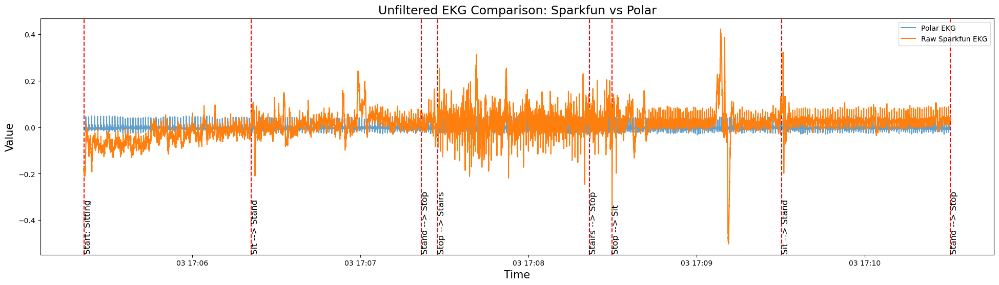

In [23]:
fig,ax = plt.subplots(figsize=(24,6))

label_pos =  sum((ECG_Sensor['normalized'].min(),ECG_Polar['normalized'].min()))/2

plt.axvline(x = Start,linestyle ="--", color = 'r')
plt.text(Start,label_pos,'Start: Sitting',color='k', rotation=90, fontsize = 12)

plt.axvline(x = E1, linestyle ="--", color = 'r')
plt.text(E1,label_pos,'Sit --> Stand',color='k', rotation=90, fontsize = 12)

plt.axvline(x = E2, linestyle ="--", color = 'r')
plt.text(E2,label_pos,'Stand --> Stop',color='k', rotation=90, fontsize = 12)

plt.axvline(x = E3, linestyle ="--", color = 'r')
plt.text(E3,label_pos,'Stop --> Stairs',color='k', rotation=90, fontsize = 12)

plt.axvline(x = E4, linestyle ="--", color = 'r')
plt.text(E4,label_pos,'Stairs --> Stop',color='k', rotation=90, fontsize = 12)

plt.axvline(x = E5, linestyle ="--", color = 'r')
plt.text(E5,label_pos,'Stop --> Sit',color='k', rotation=90, fontsize = 12)

plt.axvline(x = E6, linestyle ="--", color = 'r')
plt.text(E6,label_pos,'Sit --> Stand',color='k', rotation=90, fontsize = 12)

plt.axvline(x = End,linestyle ="--", color = 'r')
plt.text(End,label_pos,'Stand --> Stop',color='k', rotation=90, fontsize = 12)


ax.plot(ECG_Polar.normalized[Start:End],label = 'Polar EKG', alpha = .7)
ax.plot(ECG_Sensor.normalized[Start:End],label = 'Raw Sparkfun EKG') 


plt.ylabel('Value',fontsize = 15) 
plt.xlabel('Time', fontsize = 15)
plt.title('Unfiltered EKG Comparison: Sparkfun vs Polar', fontsize = 17)
#Why is this -2 plotting?? 

plt.legend(loc='upper right')
plt.show()

Text(0, 0.5, 'Standing')

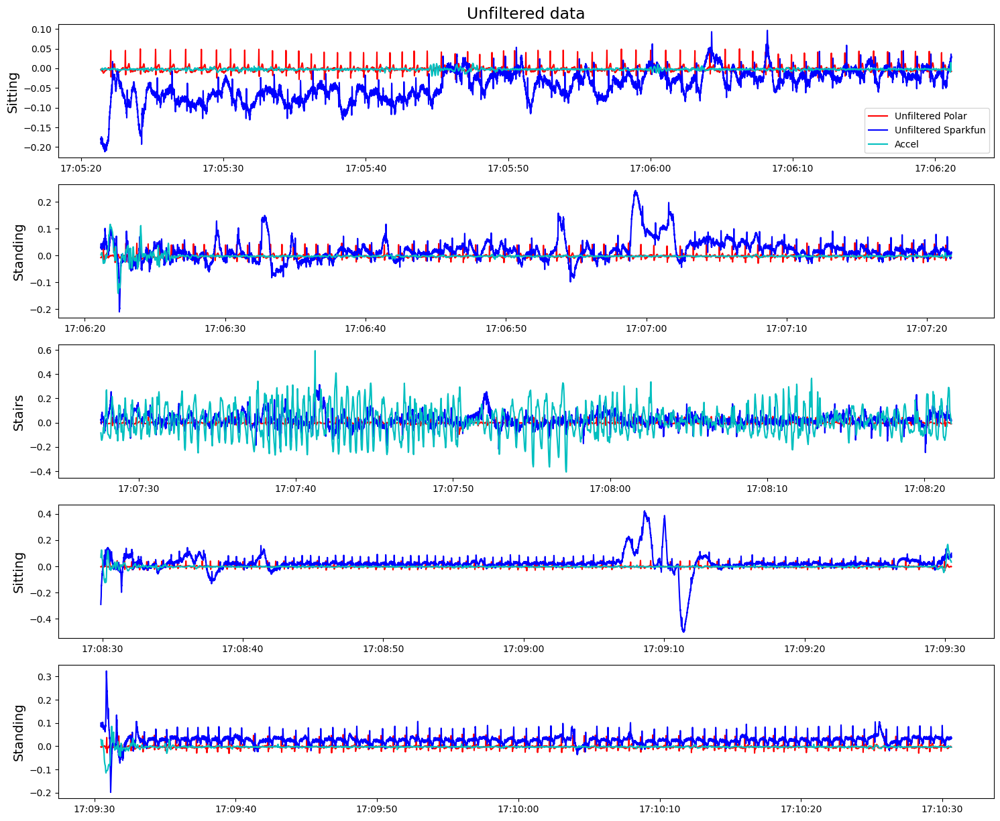

In [24]:
fig, axs = plt.subplots(5, 1,figsize=(18,15))

axs[0].set_title('Unfiltered data', fontsize = 17)
axs[0].plot(ECG_Polar.normalized[Start:E1],color = 'r', label = 'Unfiltered Polar')
axs[0].plot(ECG_Sensor.normalized[Start:E1], color = 'b', label = 'Unfiltered Sparkfun')
axs[0].plot(Accel_Sensor.energy[Start:E1], color = 'c', label = 'Accel')
axs[0].set_ylabel('Sitting', fontsize= 14)
axs[0].legend()

axs[1].plot(ECG_Polar.normalized[E1:E2], color = 'r')
axs[1].plot(ECG_Sensor.normalized[E1:E2], color = 'b')
axs[1].plot(Accel_Sensor.energy[E1:E2], color = 'c')
axs[1].set_ylabel('Standing', fontsize= 14)

axs[2].plot(ECG_Polar.normalized[E3:E4], color = 'r')
axs[2].plot(ECG_Sensor.normalized[E3:E4], color = 'b')
axs[2].plot(Accel_Sensor.energy[E3:E4], color = 'c')
axs[2].set_ylabel('Stairs', fontsize= 14)

axs[3].plot(ECG_Polar.normalized[E5:E6], color = 'r')
axs[3].plot(ECG_Sensor.normalized[E5:E6], color = 'b')
axs[3].plot(Accel_Sensor.energy[E5:E6], color = 'c')
axs[3].set_ylabel('Sitting', fontsize= 14)

axs[4].plot(ECG_Polar.normalized[E6:End], color = 'r')
axs[4].plot(ECG_Sensor.normalized[E6:End], color = 'b')
axs[4].plot(Accel_Sensor.energy[E6:End], color = 'c')
axs[4].set_ylabel('Standing', fontsize= 14)




## Sparkfun Bandpass vs Pan Tompkins Filtered (while participant sits)

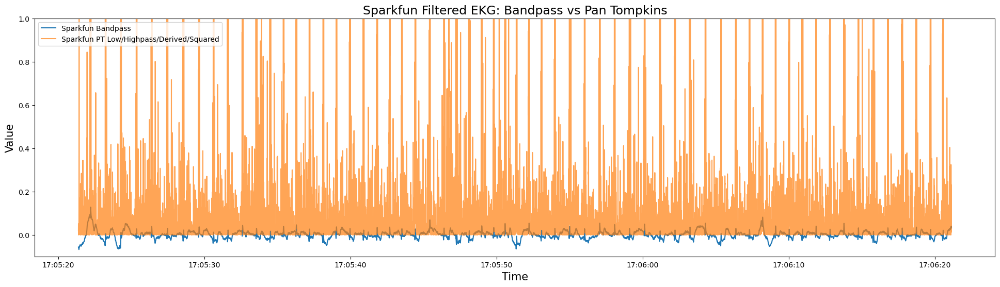

In [25]:
fig,ax = plt.subplots(figsize=(24,6))


ax.plot(ECG_Sensor['bandpass_ecg'][Start:E1],label = 'Sparkfun Bandpass') 
ax.plot(ECG_Sensor['ptLH_ecg'][Start:E1],label = 'Sparkfun PT Low/Highpass/Derived/Squared', alpha = .7) 


plt.ylim(-.1,1)
plt.ylabel('Value',fontsize = 15) 
plt.xlabel('Time', fontsize = 15)
plt.title('Sparkfun Filtered EKG: Bandpass vs Pan Tompkins', fontsize = 17)


ax.legend()
plt.show()

# Compute Sampling Frequency

In [26]:
#Computing Sampling Frequencies
fq_p = 1/ECG_Polar.ts_diff.mean().total_seconds()
fq_e = 1/ECG_Sensor.ts_diff.mean().total_seconds()
fq_a = 1/Accel_Sensor.ts_diff.mean().total_seconds()
print(fq_p)
print(fq_e)
print(fq_a)

129.92074834351047
329.59789057350037
58.9935697009026


# Define Window Timestamps 

In [27]:
#Redefine Start (so won't cause problems later on in code)
Window_Start = Start
Window_Size = 10

#We want windows to be overlapping by half the size of the window
HalfWindow_Size = Window_Size/2
Window_Timestamps = [] 

while Window_Start<End: 

    #Saving timestamp of where window begins 
    Window_Timestamps.append(Window_Start)
    #Only increasing window start by 1/2 (to keep neighboring windows overlapping)
    Window_Start = Window_Start+ pd.to_timedelta(HalfWindow_Size, unit='s')


# Peak Detection 
### Polar Bandpass, Sparkfun Bandpass, Sparkfun Pan & Tompkins

In [28]:
polar_peaks, _ = find_peaks(ECG_Polar['bandpass_ecg'][Start:End],distance= fq_p/3, height=.01)
sparkfun_peaks, _ = find_peaks(ECG_Sensor['bandpass_ecg'][Start:End], distance= fq_e/3, height=.01)
sparkfunPT_peaks, _ = find_peaks(ECG_Sensor['ptLH_ecg_integratedrolling'][Start:End], distance= fq_e/3, height=.01)

#Get peak location in Date time
peaksdt_p = ECG_Polar[Start:End].iloc[polar_peaks]
peaksdt_sparkfun = ECG_Sensor[Start:End].iloc[sparkfun_peaks]
peaksdt_sparkfunpt = ECG_Sensor[Start:End].iloc[sparkfunPT_peaks]

#Threshold as 2/3rd the range
accelrange = (Accel_Sensor['energy'].max() - Accel_Sensor['energy'].min()) 
Threshold = Accel_Sensor['energy'].min() + accelrange*.5
accel_peaks, _ = find_peaks(Accel_Sensor['energy'][Start:End], distance= fq_a/4, height=Threshold)

#Get peak location in Date time
peaksdt_a = Accel_Sensor[Start:End].iloc[accel_peaks]


### Slight Shift to Line Up Signals

In [29]:
#Adjust for slight shift (We don't know if this shift is the same with sparkfun?)

ECG_Sensor.index = ECG_Sensor.index - pd.to_timedelta('200ms')
peaksdt_sparkfun.index = peaksdt_sparkfun.index - pd.to_timedelta('200ms')
peaksdt_sparkfunpt.index = peaksdt_sparkfunpt.index - pd.to_timedelta('200ms')

# Visualize Peaks & Compute Percent Error 
### Polar Bandpass vs Exthub Bandpass

Accel PC, Sparkfun PC, Polar PC, Percent Error:,0,16,9, 78
Accel PC, Sparkfun PC, Polar PC, Percent Error:,0,19,10, 90
Accel PC, Sparkfun PC, Polar PC, Percent Error:,0,18,11, 64
Accel PC, Sparkfun PC, Polar PC, Percent Error:,0,18,11, 64
Accel PC, Sparkfun PC, Polar PC, Percent Error:,0,19,12, 58
Accel PC, Sparkfun PC, Polar PC, Percent Error:,0,17,11, 55
Accel PC, Sparkfun PC, Polar PC, Percent Error:,0,18,10, 80
Accel PC, Sparkfun PC, Polar PC, Percent Error:,0,16,10, 60
Accel PC, Sparkfun PC, Polar PC, Percent Error:,0,16,10, 60
Accel PC, Sparkfun PC, Polar PC, Percent Error:,0,16,10, 60
Accel PC, Sparkfun PC, Polar PC, Percent Error:,0,16,11, 45
Accel PC, Sparkfun PC, Polar PC, Percent Error:,2,18,12, 50
Accel PC, Sparkfun PC, Polar PC, Percent Error:,2,17,12, 42
Accel PC, Sparkfun PC, Polar PC, Percent Error:,0,14,12, 17
Accel PC, Sparkfun PC, Polar PC, Percent Error:,0,16,12, 33
Accel PC, Sparkfun PC, Polar PC, Percent Error:,0,19,11, 73
Accel PC, Sparkfun PC, Polar PC, Percent 

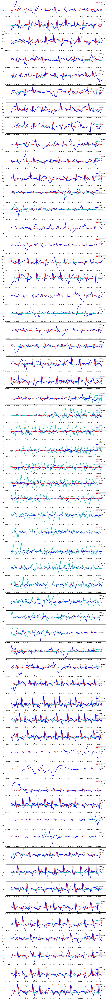

In [30]:
fig, axs = plt.subplots((len(Window_Timestamps)-3), 1,figsize=(15,150))
windowpercenterror_sum = []
for i in range(len(Window_Timestamps)-3):

    #Plotting windows
    axs[i].plot(ECG_Polar['bandpass_ecg'][Window_Timestamps[i]:Window_Timestamps[i+2]],color = 'r', label = 'Polar')
    axs[i].plot(ECG_Sensor['bandpass_ecg'][Window_Timestamps[i]:Window_Timestamps[i+2]], color = 'b', label = ' Sparkfun')
    axs[i].plot(Accel_Sensor['energy'][Window_Timestamps[i]:Window_Timestamps[i+2]], color = 'c', label = 'Energy')

    axs[i].legend(loc='upper right')

    #Finding peaks within the window
    windowpeaks_p = peaksdt_p[Window_Timestamps[i]:Window_Timestamps[i+2]]
    windowpeaks_sparkfun = peaksdt_sparkfun[Window_Timestamps[i]:Window_Timestamps[i+2]]
    windowpeaks_a = peaksdt_a[Window_Timestamps[i]:Window_Timestamps[i+2]]

    #Plotting Peaks
    axs[i].scatter(windowpeaks_p.index,windowpeaks_p['bandpass_ecg'], marker='x')
    axs[i].scatter(windowpeaks_sparkfun.index,windowpeaks_sparkfun['bandpass_ecg'], marker='x')
    axs[i].scatter(windowpeaks_a.index,windowpeaks_a['energy'], marker='x')

    #Summing up peaks for each window and computing percent error
    label = "Accel PC, Sparkfun PC, Polar PC, Percent Error:"

    accelpeakcount = len(windowpeaks_a)
    sparkfunpeakcount= len(windowpeaks_sparkfun)
    polarpeakcount= len(windowpeaks_p)
    windowpercenterror= abs(round(((sparkfunpeakcount - polarpeakcount)/polarpeakcount) *100))
    windowpercenterror_sum.append(windowpercenterror)
    print("{},{},{},{}, {}".format(label,accelpeakcount,sparkfunpeakcount, polarpeakcount,
                              windowpercenterror))
   
    i+=1
    


#Summing up total peaks and computing overall percent error
totalsparkfun= len(peaksdt_sparkfun)
totalpolar = len(peaksdt_p)
totalaccel = len(peaksdt_a)



Total = fontstyle.apply('Total Accel PC, Sparkfun PC, Polar PC, Percent Error:', 'bold/Italic/orange/GREEN_BG')
print(Total)
print(totalaccel)
print(totalsparkfun)
print(totalpolar)
print(sum(windowpercenterror_sum)/(len(windowpercenterror_sum)))

0,11,9,22
0,12,10,20
0,14,11,27
0,13,11,18
0,15,12,25
0,14,11,27
0,11,10,10
0,11,10,10
0,10,10,0
0,11,10,10
0,13,11,18
2,17,12,42
2,17,12,42
0,14,12,17
0,14,12,17
0,13,11,18
0,12,10,20
0,13,11,18
0,12,11,9
0,12,11,9
0,12,11,9
0,11,11,0
0,13,13,0
2,16,13,23
13,20,12,67
21,23,14,64
22,24,16,50
24,24,15,60
24,24,15,60
21,22,17,29
20,21,17,24
18,22,17,29
16,22,18,22
17,21,18,17
16,21,19,11
15,22,19,16
12,23,19,21
5,21,19,11
0,18,18,0
0,17,17,0
0,17,17,0
0,17,17,0
0,16,16,0
0,16,16,0
0,19,15,27
0,19,14,36
0,16,13,23
0,17,12,42
1,18,11,64
1,17,11,55
0,15,13,15
0,12,12,0
0,11,11,0
0,12,12,0
0,12,12,0
0,12,12,0
0,12,12,0
0,12,12,0
0,13,13,0
Total Sparkfun PC, Polar PC, Percent Error:
488
410
19.559322033898304


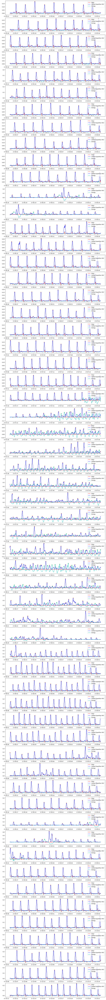

In [31]:
fig, axs = plt.subplots((len(Window_Timestamps)-3), 1,figsize=(15,150))
windowpercenterror_sum = []
for i in range(len(Window_Timestamps)-3):

    #Plotting windows
    axs[i].plot(ECG_Polar['bandpass_ecg'][Window_Timestamps[i]:Window_Timestamps[i+2]],color = 'r', label = 'Polar')
    axs[i].plot(ECG_Sensor['ptLH_ecg_integratedrolling'][Window_Timestamps[i]:Window_Timestamps[i+2]],color = 'b', label = 'Shifted Sparkfun P&T')
    axs[i].plot(Accel_Sensor['energy'][Window_Timestamps[i]:Window_Timestamps[i+2]], color = 'c', label = 'Energy')
    axs[i].legend(loc='upper right')

    #Finding peaks within the window
    windowpeaks_p = peaksdt_p[Window_Timestamps[i]:Window_Timestamps[i+2]]
    windowpeaks_sparkfunpt = peaksdt_sparkfunpt[Window_Timestamps[i]:Window_Timestamps[i+2]]
    windowpeaks_a = peaksdt_a[Window_Timestamps[i]:Window_Timestamps[i+2]]

    #Plotting Peaks
    axs[i].scatter(windowpeaks_p.index,windowpeaks_p['bandpass_ecg'], marker='x')
    axs[i].scatter(windowpeaks_sparkfunpt.index,windowpeaks_sparkfunpt['ptLH_ecg_integratedrolling'], marker='x')
    axs[i].scatter(windowpeaks_a.index,windowpeaks_a['energy'], marker='x')

    #Summing up peaks for each window and computing percent error
  
    #label = "Accel PC, Sparkfun PC, Polar PC, Percent Error:"
    accelpeakcount = len(windowpeaks_a)
    sparkfunpeakcount= len(windowpeaks_sparkfunpt)
    polarpeakcount= len(windowpeaks_p)
    windowpercenterror= abs(round(((sparkfunpeakcount - polarpeakcount)/polarpeakcount) *100))
    windowpercenterror_sum.append(windowpercenterror)
    print("{},{},{},{}".format(accelpeakcount,sparkfunpeakcount, polarpeakcount,
                         windowpercenterror))
    
  
    i+=1

#Summing up total peaks and computing overall percent error
totalsparkfun_pt= len(peaksdt_sparkfunpt)
totalpolar = len(peaksdt_p)



Total = fontstyle.apply('Total Sparkfun PC, Polar PC, Percent Error:', 'bold/Italic/orange/GREEN_BG')
print(Total)
print(totalsparkfun_pt)
print(totalpolar)
# per window: 
print(sum(windowpercenterror_sum)/(len(windowpercenterror_sum)))



# Compute Heart Rate Variability (HRV)
### Time Difference Between Peaks (for Polar vs Sparkfun with Pan & Tompkins filtering)

In [32]:
HRV_polar = peaksdt_p.index.to_series().diff().dt.total_seconds()
HRV_sparkfun = peaksdt_sparkfun.index.to_series().diff().dt.total_seconds()
HRV_sparkfunpt = peaksdt_sparkfunpt.index.to_series().diff().dt.total_seconds()

#Standard Deviation between Sparkfun & Polar

HRV_polar

time
2023-05-03 17:05:22.108938614         NaN
2023-05-03 17:05:23.132683072    1.023744
2023-05-03 17:05:24.179545658    1.046863
2023-05-03 17:05:25.257191092    1.077645
2023-05-03 17:05:26.288634892    1.031444
                                   ...   
2023-05-03 17:10:26.727236418    0.777503
2023-05-03 17:10:27.520096972    0.792861
2023-05-03 17:10:28.320661196    0.800564
2023-05-03 17:10:29.105839026    0.785178
2023-05-03 17:10:29.906392488    0.800553
Name: time, Length: 410, dtype: float64

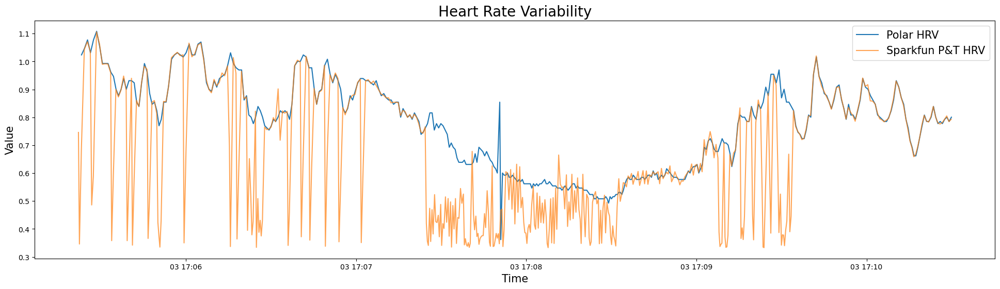

In [33]:
fig,ax = plt.subplots(figsize=(24,6))

ax.plot(HRV_polar[Start:End],label = 'Polar HRV') 
ax.plot(HRV_sparkfunpt[Start:End],label = 'Sparkfun P&T HRV', alpha = .7) 


plt.ylabel('Value',fontsize = 15) 
plt.xlabel('Time', fontsize = 15)
plt.title('Heart Rate Variability', fontsize = 20)


ax.legend(fontsize = 15)
plt.show()

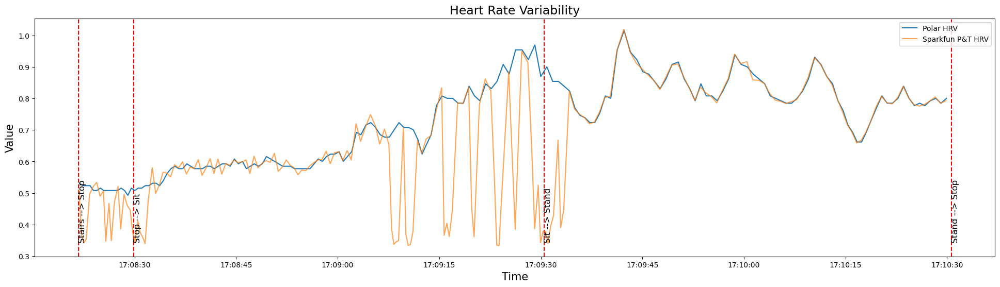

In [34]:
fig,ax = plt.subplots(figsize=(24,6))

label_pos =  sum((HRV_polar.min(),HRV_sparkfunpt.min()))/2

plt.axvline(x = E4, linestyle ="--", color = 'r')
plt.text(E4,label_pos,'Stairs --> Stop',color='k', rotation=90, fontsize = 12)

plt.axvline(x = E5, linestyle ="--", color = 'r')
plt.text(E5,label_pos,'Stop --> Sit',color='k', rotation=90, fontsize = 12)

plt.axvline(x = E6, linestyle ="--", color = 'r')
plt.text(E6,label_pos,'Sit --> Stand',color='k', rotation=90, fontsize = 12)

plt.axvline(x = End,linestyle ="--", color = 'r')
plt.text(End,label_pos,'Stand --> Stop',color='k', rotation=90, fontsize = 12)

ax.plot(HRV_polar[E4:End],label = 'Polar HRV') 
ax.plot(HRV_sparkfunpt[E4:End],label = 'Sparkfun P&T HRV', alpha = .7) 

plt.ylabel('Value',fontsize = 15) 
plt.xlabel('Time', fontsize = 15)
plt.title('Heart Rate Variability', fontsize = 17)


ax.legend()
plt.show()